<a href="https://colab.research.google.com/github/Rstam59/Machine-Learning-Projects/blob/main/Copy_of_crack_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!kaggle datasets download -d yatata1/crack-dataset

Dataset URL: https://www.kaggle.com/datasets/yatata1/crack-dataset
License(s): CC-BY-SA-4.0
100% 12.7G/12.7G [11:52<00:00, 19.2MB/s]



In [ ]:
!unzip /content/crack-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1899.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_19.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_190.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1900.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1901.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1902.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1903.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1904.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1905.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1906.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1907.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1908.png  
  inflating: Unity_Generation/Concrete/Masks/model_6_iteration_1

In [ ]:
!pip install -q mlflow albumentations opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 103.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 119.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 94.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.7/268.7 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.8/148.8 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.4/228.4 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.5/136.5 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.6/144.6 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import os
import json
import random
from pathlib import Path
from collections import Counter
import time

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

import mlflow
import mlflow.pytorch

In [ ]:
SEED = 42

DATA_DIR = Path('/content/Concrete/Concrete/Positive')

IMAGE_DIR = DATA_DIR / 'Images'
MASK_DIR = DATA_DIR / 'Masks'

ARTIFACT_DIR = Path('artifacts')
ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)

IMAGE_SIZE = 256
TASK_TYPE = 'binary'
NUM_CLASSES = 1
MASK_FORMAT = 'binary_jpg_grayscale_thresholded'
MASK_THRESHOLD = 127

device = 'cuda' if torch.cuda.is_available() else 'cpu'
PIN_MEMORY = device == 'cuda'

print('Device:', device)
print('Image dir:', IMAGE_DIR)
print('Mask dir:', MASK_DIR)

Device: cuda
Image dir: /content/Concrete/Concrete/Positive/Images
Mask dir: /content/Concrete/Concrete/Positive/Masks


In [ ]:
def set_seed(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)

    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(SEED)

In [ ]:
assert DATA_DIR.exists(), f"DATA_DIR does not exist: {DATA_DIR}"
assert IMAGE_DIR.exists(), f'IMAGE_DIR does not exist: {IMAGE_DIR}'
assert MASK_DIR.exists(), f'MASK_DIR does not exist: {MASK_DIR}'

print('Folders exist.')

Folders exist.


In [ ]:
IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}
MASK_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}

image_paths = sorted([
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in IMAGE_EXTENSIONS
])

mask_paths = sorted([
    p for p in MASK_DIR.iterdir()
    if p.suffix.lower() in MASK_EXTENSIONS
])

print('Number of Images', len(image_paths))
print('Number of Masks', len(mask_paths))

print('Example images:')
print(image_paths[:5])

print('Example masks:')
print(mask_paths[:5])

Number of Images 8818
Number of Masks 8819
Example images:
[PosixPath('/content/Concrete/Concrete/Positive/Images/CFD_001.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Images/CFD_002.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Images/CFD_003.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Images/CFD_004.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Images/CFD_005.jpg')]
Example masks:
[PosixPath('/content/Concrete/Concrete/Positive/Masks/CFD_001.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Masks/CFD_002.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Masks/CFD_003.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Masks/CFD_004.jpg'), PosixPath('/content/Concrete/Concrete/Positive/Masks/CFD_005.jpg')]


In [ ]:
image_map = {p.stem: p for p in image_paths}
mask_map = {p.stem: p for p in mask_paths}

common_stems = sorted(set(image_map.keys()) & set(mask_map.keys()))

missing_masks = sorted(set(image_map.keys()) - set(mask_map.keys()))
missing_images = sorted(set(mask_map.keys()) - set(image_map.keys()))

print('Matched pairs:', len(common_stems))
print('Images without masks:', len(missing_masks))
print('Masks without Images:', len(missing_images))

print('Missing mask examples:', missing_masks[:10])
print('Missing images examples:', missing_images[:10])

Matched pairs: 8818
Images without masks: 0
Masks without Images: 1
Missing mask examples: []
Missing images examples: ['CRACK500_20160328_153548_1281_1081']


In [ ]:
pairs_df = pd.DataFrame({
    'stem': common_stems,
    'image_path': [str(image_map[stem]) for stem in common_stems],
    'mask_path': [str(mask_map[stem]) for stem in common_stems]
})

pairs_df.head()

,stem,image_path,mask_path
0,CFD_001,/content/Concrete/Concrete/Positive/Images/CFD...,/content/Concrete/Concrete/Positive/Masks/CFD_...
1,CFD_002,/content/Concrete/Concrete/Positive/Images/CFD...,/content/Concrete/Concrete/Positive/Masks/CFD_...
2,CFD_003,/content/Concrete/Concrete/Positive/Images/CFD...,/content/Concrete/Concrete/Positive/Masks/CFD_...
3,CFD_004,/content/Concrete/Concrete/Positive/Images/CFD...,/content/Concrete/Concrete/Positive/Masks/CFD_...
4,CFD_005,/content/Concrete/Concrete/Positive/Images/CFD...,/content/Concrete/Concrete/Positive/Masks/CFD_...


In [ ]:
assert len(pairs_df) > 0, 'No image-mask pairs found. Check IMAGE_DIR, MASK_DIR or file name matching'

In [ ]:
def read_image_rgb(path: str) -> np.ndarray:
    image = cv2.imread(str(path), cv2.IMREAD_COLOR)

    if image is None:
        raise ValueError(f'Could not read image {path}')

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image


def read_mask_grayscale(path: str) -> np.ndarray:
    mask = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)

    if mask is None:
        raise ValueError(f'Could not read mask: {path}')

    return mask


In [ ]:
def binarize_crack_mask(
        mask: np.ndarray,
        threshold: int = 127,
        invert: bool = False,
) -> np.ndarray:
    """
    Converts grayscale crack mask to binary labels.

    Normal Case:
        black background, white crack:
        pixel > threshold -> 1

    Inverted Case:
        white background, black crack:
        pixel < threshold -> 1
    """

    if invert:
        binary_mask = (mask < threshold).astype(np.uint8)
    else:
        binary_mask = (mask > threshold).astype(np.uint8)

    return binary_mask


In [ ]:
sample_row = pairs_df.iloc[0]

print('Image Path:', sample_row['image_path'])
print('Mask Path:', sample_row['mask_path'])

image = read_image_rgb(sample_row['image_path'])
mask_raw = read_mask_grayscale(sample_row['mask_path'])
mask_binary = binarize_crack_mask(mask_raw, threshold=MASK_THRESHOLD)

print('Image shape:', image.shape, image.dtype)
print('Raw mask shape:', mask_raw.shape, mask_raw.dtype)
print('Binary mask shape:', mask_binary.shape, mask_binary.dtype)

print('Raw mask min/max:', mask_raw.min(), mask_raw.max())
print('Raw mask unique values sample:', np.unique(mask_raw)[:30])
print('Binary mask unique values:', np.unique(mask_binary))
print('Foreground ratio:', mask_binary.mean())

Image Path: /content/Concrete/Concrete/Positive/Images/CFD_001.jpg
Mask Path: /content/Concrete/Concrete/Positive/Masks/CFD_001.jpg
Image shape: (448, 448, 3) uint8
Raw mask shape: (448, 448) uint8
Binary mask shape: (448, 448) uint8
Raw mask min/max: 0 255
Raw mask unique values sample: [  0   1   2   3   4   5   6   7 249 250 251 252 253 254 255]
Binary mask unique values: [0 1]
Foreground ratio: 0.011972855548469387


In [ ]:
def inspect_dataset_pairs(
        pairs_df: pd.DataFrame,
        threshold: int = 127,
        invert: bool = False,
        max_unique_values_to_show: int = 30,
) -> dict:
    bad_samples = []

    raw_mask_value_counter = Counter()
    binary_mask_value_counter = Counter()

    image_shapes = Counter()
    raw_mask_shapes = Counter()
    binary_mask_shapes = Counter()

    foreground_ratios = []
    empty_masks = []
    full_masks = []

    for _, row in pairs_df.iterrows():
        image_path = row['image_path']
        mask_path = row['mask_path']

        try:
            image = read_image_rgb(image_path)
            mask_raw = read_mask_grayscale(mask_path)
            mask_binary = binarize_crack_mask(
                mask_raw,
                threshold=threshold
            )

            image_shapes[image.shape] += 1
            raw_mask_shapes[mask_raw.shape] += 1
            binary_mask_shapes[mask_binary.shape] += 1

            raw_unique_values = np.unique(mask_raw)

            for value in raw_unique_values[:max_unique_values_to_show]:
                raw_mask_value_counter[int(value)] += 1

            binary_unique_numbers = np.unique(mask_binary)

            for value in binary_unique_numbers:
                binary_mask_value_counter[int(value)] += 1

            if image.shape[:2] != mask_raw.shape[:2]:
                bad_samples.append({
                    'image_path': image_path,
                    'mask_path': mask_path,
                    'reason': f'shape mismatch image={image.shape}, mask={mask_raw.shape}'
                })
                continue

            foreground_ratio = float(mask_binary.mean())
            foreground_ratios.append(foreground_ratio)

            if foreground_ratio == 0.0:
                empty_masks.append({
                    'image_path': image_path,
                    'mask_path': mask_path,
                    'foreground_ratio': foreground_ratio
                })

            if foreground_ratio == 1.0:
                full_masks.append({
                    'image_path': image_path,
                    'mask_path': mask_path,
                    'foreground_ratio': foreground_ratio
                })


        except Exception as e:
            bad_samples.append({
                'image_path': image_path,
                'mask_path': mask_path,
                'reason': str(e)
            })

    return {
        'bad_samples': bad_samples,
        'image_shapes': image_shapes,
        'raw_mask_shapes': raw_mask_shapes,
        'binary_mask_shapes': binary_mask_shapes,
        'raw_mask_value_counter': raw_mask_value_counter,
        'binary_mask_value_counter': binary_mask_value_counter,
        'foreground_pixel_ratios': foreground_ratios,
        'empty_masks': empty_masks,
        'full_masks': full_masks
    }

In [ ]:
inspection = inspect_dataset_pairs(
    pairs_df,
    threshold=MASK_THRESHOLD,
    invert=False
)

print('Bad samples:', len(inspection['bad_samples']))
print('Image shapes:', inspection['image_shapes'].most_common(10))
print('Raw mask shapes:', inspection['raw_mask_shapes'].most_common(10))
print('Binary mask shapes:', inspection['binary_mask_shapes'].most_common(10))

print('Raw mask values:', inspection['raw_mask_value_counter'].most_common(30))
print('Binary mask values', inspection['binary_mask_value_counter'].most_common())

print('Empty masks:', len(inspection['empty_masks']))
print('Full masks:', len(inspection['full_masks']))

Bad samples: 21
Image shapes: [((448, 448, 3), 8796), ((768, 768, 3), 22)]
Raw mask shapes: [((448, 448), 8796), ((256, 256), 21), ((768, 768), 1)]
Binary mask shapes: [((448, 448), 8796), ((256, 256), 21), ((768, 768), 1)]
Raw mask values: [(0, 8818), (1, 8796), (2, 8796), (3, 8796), (4, 8796), (5, 8794), (6, 8689), (255, 8547), (251, 8525), (252, 8525), (253, 8525), (254, 8525), (250, 8523), (249, 8385), (7, 8339), (248, 7948), (247, 5009), (8, 4882), (246, 4800), (245, 4762), (244, 4746), (243, 4428), (9, 3420), (242, 3404), (10, 2047), (241, 1728), (11, 1147), (240, 637), (12, 603), (13, 378)]
Binary mask values [(0, 8818), (1, 8818)]
Empty masks: 0
Full masks: 0


In [ ]:
inspection['bad_samples'][:10]

[{'image_path': '/content/Concrete/Concrete/Positive/Images/_002.png',
  'mask_path': '/content/Concrete/Concrete/Positive/Masks/_002.png',
  'reason': 'shape mismatch image=(768, 768, 3), mask=(256, 256)'},
 {'image_path': '/content/Concrete/Concrete/Positive/Images/_003.png',
  'mask_path': '/content/Concrete/Concrete/Positive/Masks/_003.png',
  'reason': 'shape mismatch image=(768, 768, 3), mask=(256, 256)'},
 {'image_path': '/content/Concrete/Concrete/Positive/Images/_004.png',
  'mask_path': '/content/Concrete/Concrete/Positive/Masks/_004.png',
  'reason': 'shape mismatch image=(768, 768, 3), mask=(256, 256)'},
 {'image_path': '/content/Concrete/Concrete/Positive/Images/_005.png',
  'mask_path': '/content/Concrete/Concrete/Positive/Masks/_005.png',
  'reason': 'shape mismatch image=(768, 768, 3), mask=(256, 256)'},
 {'image_path': '/content/Concrete/Concrete/Positive/Images/_006.png',
  'mask_path': '/content/Concrete/Concrete/Positive/Masks/_006.png',
  'reason': 'shape mismatch 

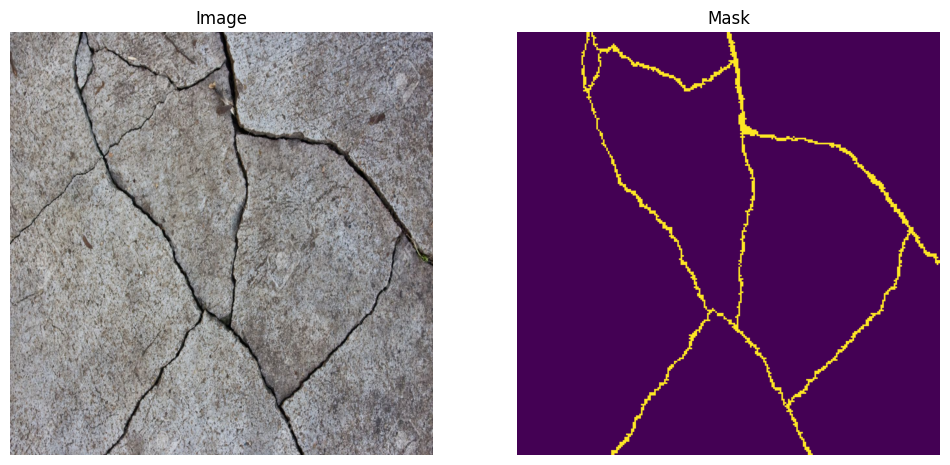

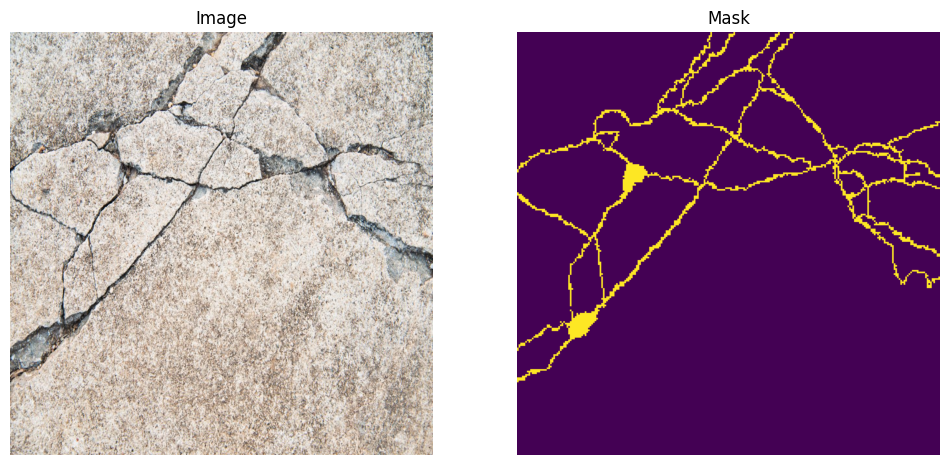

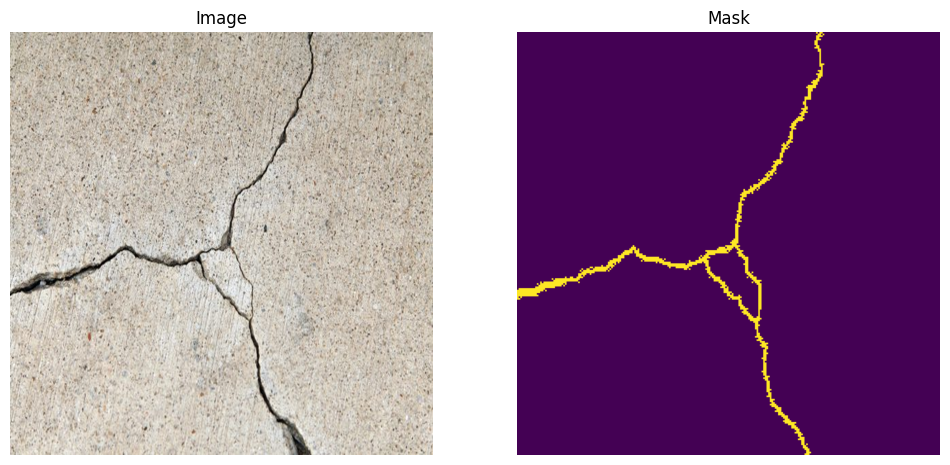

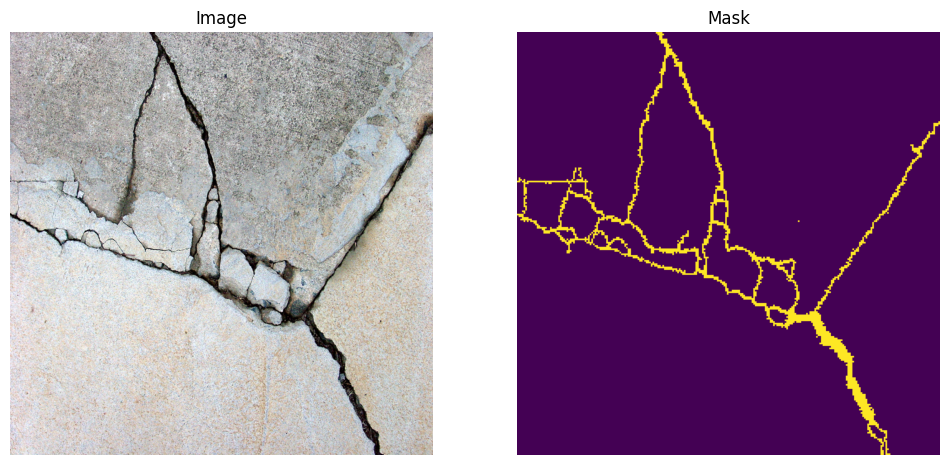

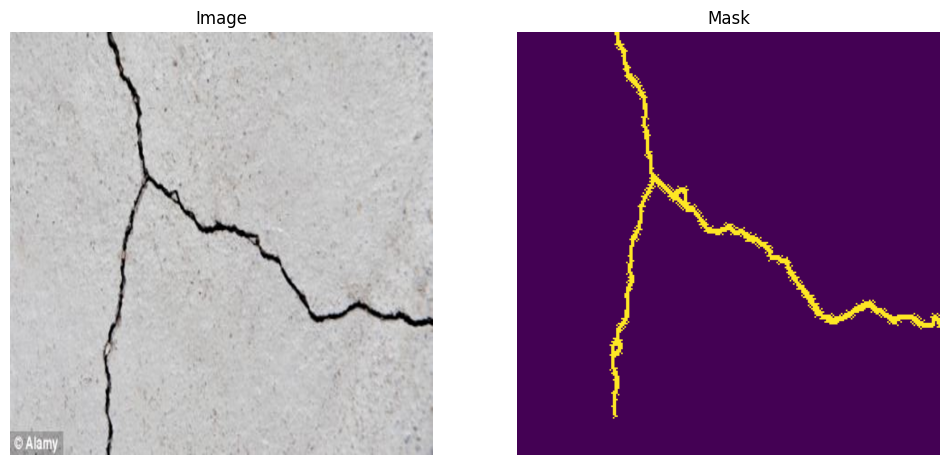

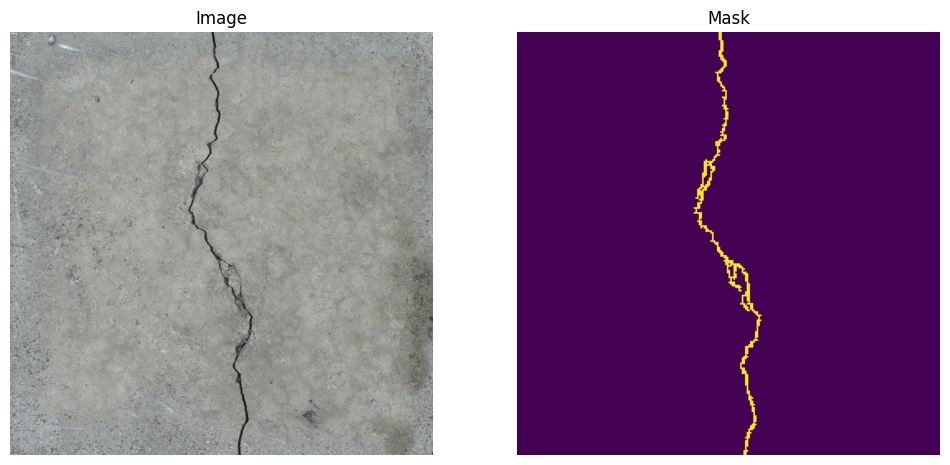

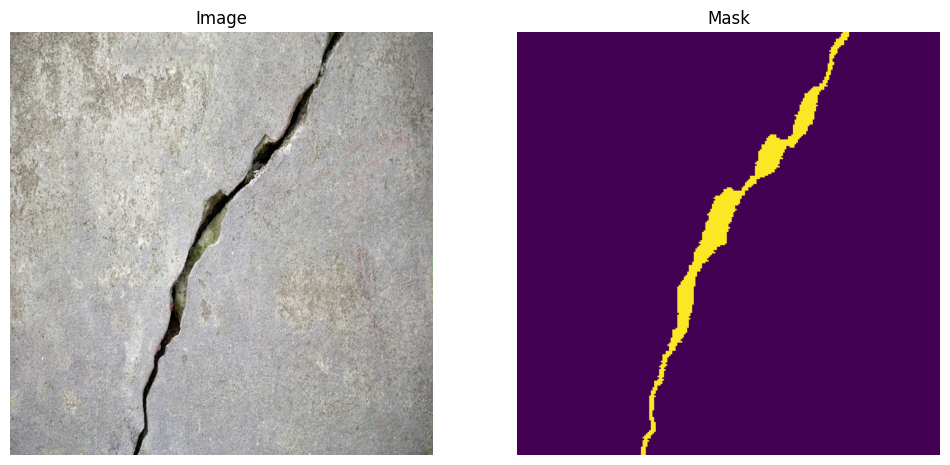

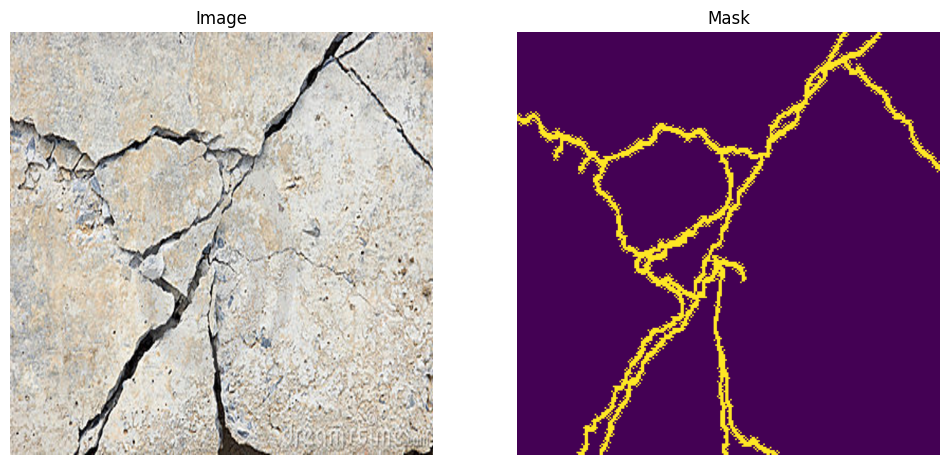

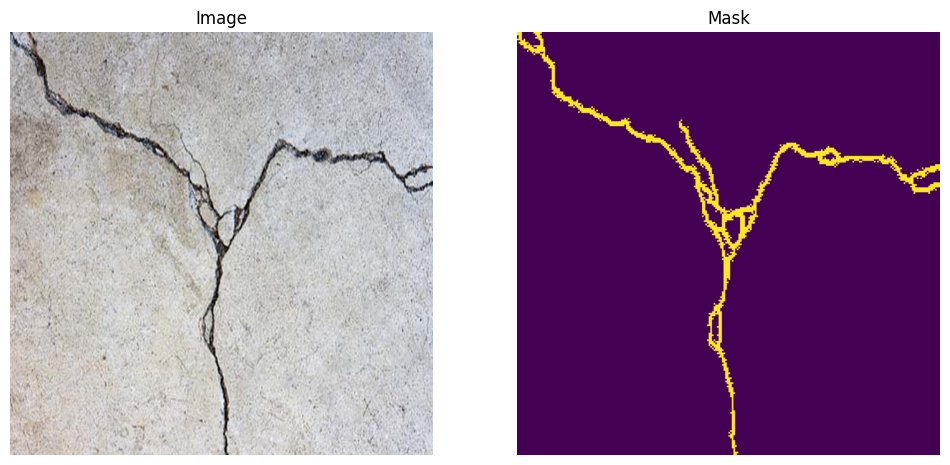

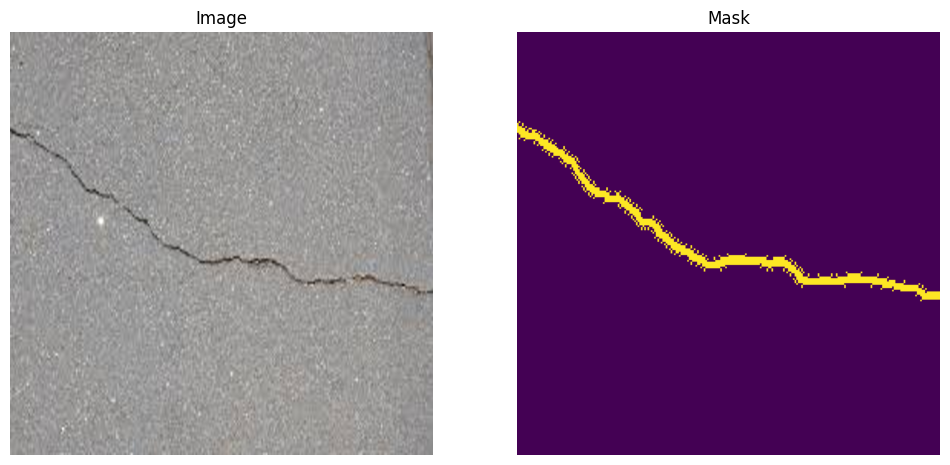

In [ ]:
def show_bad_samples(bad_sample):
    image_path = bad_sample['image_path']
    mask_path = bad_sample['mask_path']
    image = read_image_rgb(image_path)
    mask = read_mask_grayscale(mask_path)

    plt.figure(figsize=(12, 8))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title('Image')

    plt.subplot(1, 2, 2)
    plt.imshow(mask)
    plt.title('Mask')
    plt.axis('off')
    plt.show()


for bad_sample in inspection['bad_samples'][:10]:
    show_bad_samples(bad_sample)

In [ ]:
foreground_ratios = np.array(
    inspection['foreground_pixel_ratios'],
    dtype=np.float32
)

if len(foreground_ratios) == 0:
    print('No valid foreground ratios found')
    print('This means all samples failed inspection.')
    print('Check inspection[bad_samples][:10] for real error messages')
else:
    print('Average crack pixel ratio', foreground_ratios.mean())
    print('Median crack pixel ratio', np.median(foreground_ratios))
    print('Min crack pixel ratio:', foreground_ratios.min())
    print('Max crack pixel ratio:', foreground_ratios.max())

Average crack pixel ratio 0.033263
Median crack pixel ratio 0.017906968
Min crack pixel ratio: 0.0008868782
Max crack pixel ratio: 0.3287229


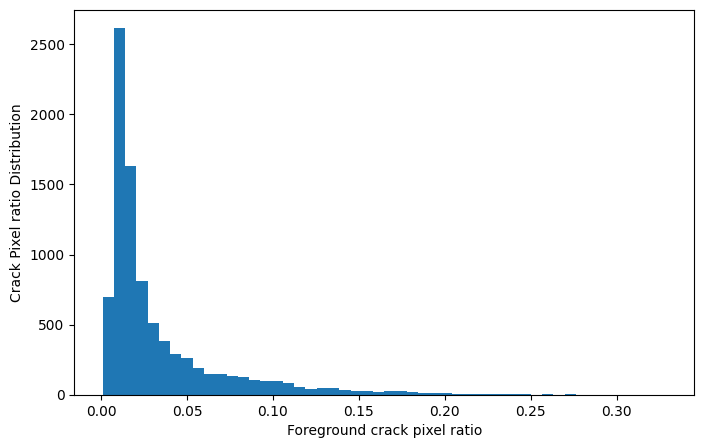

In [ ]:
if len(foreground_ratios) > 0:
    plt.figure(figsize=(8, 5))
    plt.hist(foreground_ratios, bins=50)
    plt.xlabel('Foreground crack pixel ratio')
    plt.ylabel('Crack Pixel ratio Distribution')
    plt.show()

In [ ]:
def show_image_mask_overlay(
    image_path: str,
    mask_path: str,
    threshold: int = 127,
    invert: bool = False,
    alpha: float = 0.45
) -> None:
    image = read_image_rgb(image_path)
    mask_raw = read_mask_grayscale(mask_path)
    mask_binary = binarize_crack_mask(mask_raw, threshold, invert)

    plt.figure(figsize=(16, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(image)
    plt.title('Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(mask_raw, cmap='gray')
    plt.title('Raw JPG Mask')
    plt.axis('off')


    plt.subplot(1, 4, 3)
    plt.imshow(mask_binary, cmap='gray')
    plt.title('Binary Mask')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(image)
    plt.imshow(mask_binary, cmap='jet', alpha=alpha)
    plt.title('Overlay')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

Rissbilder_for_Florian_9S6A2906_54_350_3631_4518


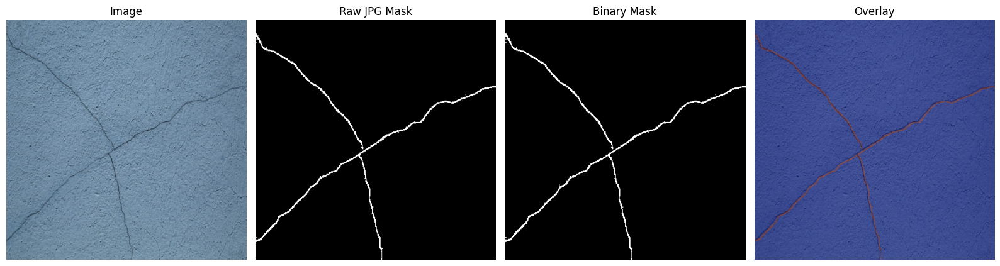

Rissbilder_for_Florian_9S6A2786_0_0_3840_5760


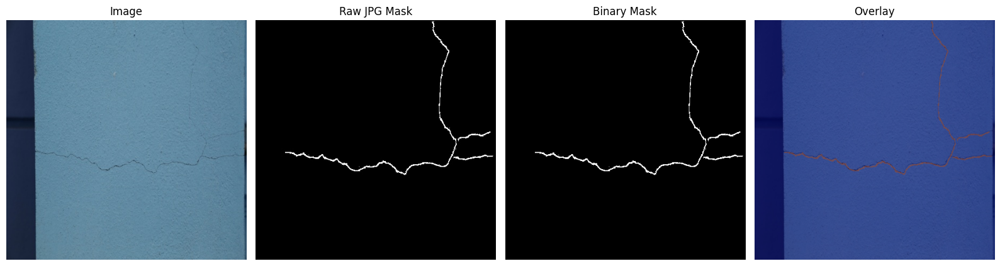

CRACK500_20160405_171215_1_361


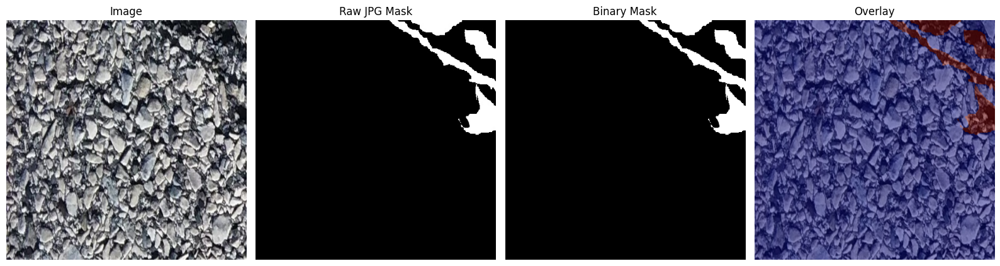

Rissbilder_for_Florian_9S6A2884_225_1234_3608_4014


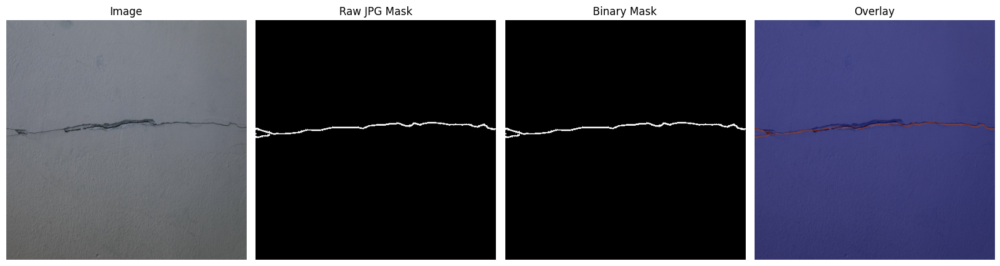

CRACK500_20160328_151056_641_1


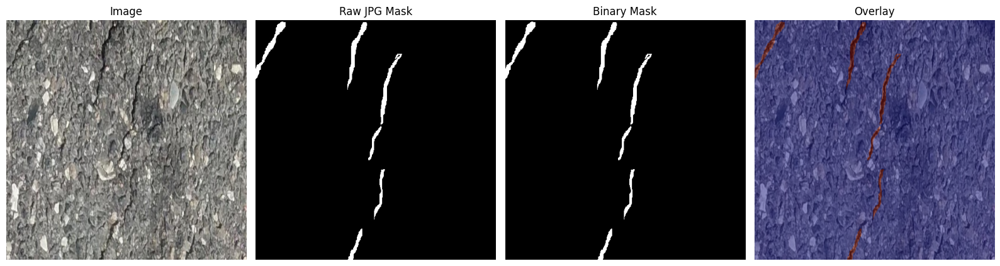

In [ ]:
sample_rows = pairs_df.sample(
    n = min(5, len(pairs_df))
)

for _, row in sample_rows.iterrows():
    print(row['stem'])
    show_image_mask_overlay(
        row['image_path'],
        row['mask_path'],
        threshold=MASK_THRESHOLD,
    )

In [ ]:
MASK_INVERT = False

dataset_metadata = {
    'data_dir': str(DATA_DIR),
    'image_dir': str(IMAGE_DIR),
    'mask_dir': str(MASK_DIR),
    'num_images': len(image_paths),
    'num_masks': len(mask_paths),
    'num_matched_pairs': len(pairs_df),
    'num_missing_masks': len(missing_masks),
    'num_missing_masks': len(missing_images),
    'num_bad_samples': len(inspection['bad_samples']),
    'mask_format': MASK_FORMAT,
    'mask_threshold': MASK_THRESHOLD,
    'mask_invert': MASK_INVERT,
    'task_type': TASK_TYPE,
    'num_classes': NUM_CLASSES,
    'image_size': IMAGE_SIZE,
    'seed': SEED
}

with open(ARTIFACT_DIR / 'dataset_metadata.json', 'w') as f:
    json.dump(dataset_metadata, f, indent=2)

pairs_df.to_csv(ARTIFACT_DIR / 'pairs.csv', index=False)
print('Saved dataset metadata and pairs CSV')

Saved dataset metadata and pairs CSV


In [ ]:
mlflow.set_experiment('crack_segmentation')

with mlflow.start_run(run_name='dataset_inspection'):
    mlflow.log_params({
        'task_type': TASK_TYPE,
        'num_classes': NUM_CLASSES,
        'image_size': IMAGE_SIZE,
        'mask_format': MASK_FORMAT,
        'mask_threshold': MASK_THRESHOLD,
        'mask_invert': MASK_INVERT,
        'num_images': len(image_paths),
        'num_masks': len(mask_paths),
        'num_matched_pairs': len(pairs_df),
        'num_missing_masks': len(missing_images),
        'num_missing_masks': len(missing_masks),
        'num_bad_samples': len(inspection['bad_samples']),
        'seed': SEED
    })


    if len(foreground_ratios) > 0:
        mlflow.log_metrics({
            'avg_foreground_ratio': float(foreground_ratios.mean()),
            'median_foreground_ratio': float(np.median(foreground_ratios)),
            'min_foreground_ratio': float(foreground_ratios.min()),
            'max_foreground_ratio': float(foreground_ratios.max())
        })

    mlflow.log_artifact(str(ARTIFACT_DIR / 'dataset_metadata.json'))
    mlflow.log_artifact(str(ARTIFACT_DIR / 'pairs.csv'))

print('Logged dataset inspection to MLflow')

2026/09/20 06:34:07 INFO mlflow.store.db.utils: Creating initial MLflow database tables...
2026/09/20 06:34:07 INFO mlflow.store.db.utils: Updating database tables
2026/09/20 06:34:09 INFO mlflow.tracking.fluent: Experiment with name 'crack_segmentation' does not exist. Creating a new experiment.


Logged dataset inspection to MLflow


#Step 2 - Split, Dataset, Transforms, DataLoaders

In [ ]:
from sklearn.model_selection import train_test_split

import albumentations as A
from albumentations.pytorch import ToTensorV2

from torch.utils.data import Dataset, DataLoader

In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 8
NUM_WORKERS = 2

MASK_THRESHOLD = 127
MASK_INVERT = False

TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15

assert abs(TRAIN_RATIO + VAL_RATIO + TEST_RATIO - 1.0) < 1e-6

In [ ]:
indices = np.arange(len(pairs_df))

train_idx, temp_idx = train_test_split(
    indices,
    test_size = (1.0 - TRAIN_RATIO),
    random_state = SEED,
    shuffle = True
)

relative_test_ratio = TEST_RATIO / (VAL_RATIO + TEST_RATIO)

val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=relative_test_ratio,
    random_state=SEED,
    shuffle=True
)


train_df = pairs_df.iloc[train_idx].reset_index(drop=True)
val_df = pairs_df.iloc[val_idx].reset_index(drop=True)
test_df = pairs_df.iloc[test_idx].reset_index(drop=True)


print('Train:', len((train_df)))
print('Val:', len((val_df)))
print('Test:', len((test_df)))

Train: 6172
Val: 1323
Test: 1323


In [ ]:
splits = {
    'train_stems': train_df['stem'].tolist(),
    'val_stems': val_df['stem'].tolist(),
    'test_stems': test_df['stem'].tolist(),
    'seed': SEED,
    'train_ratio': TRAIN_RATIO,
    'val_ratio': VAL_RATIO,
    'test_ratio': TEST_RATIO,
}

with open(ARTIFACT_DIR / 'splits.json', 'w') as f:
    json.dump(splits, f, indent=2)

train_df.to_csv(ARTIFACT_DIR / 'train_pairs.csv', index=False)
val_df.to_csv(ARTIFACT_DIR / 'val_pairs.csv', index=False)
test_df.to_csv(ARTIFACT_DIR / 'test_pairs.csv', index=False)

In [ ]:
train_transform = A.Compose([
    A.Resize(
        height = IMAGE_SIZE,
        width=IMAGE_SIZE,
        interpolation=cv2.INTER_LINEAR,
        mask_interpolation=cv2.INTER_NEAREST
    ),

    A.HorizontalFlip(p=0.5),

    A.ShiftScaleRotate(
        shift_limit=0.05,
        scale_limit=0.10,
        rotate_limit=10,
        interpolation=cv2.INTER_LINEAR,
        border_mode=cv2.BORDER_CONSTANT,
        value=0,
        mask_value=0,
        p=0.5
    ),


    A.RandomBrightnessContrast(
        brightness_limit=0.15,
        contrast_limit=0.15,
        p=0.4,
    ),

    A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.255)
    ),

    ToTensorV2()
])

/usr/local/lib/python3.13/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipykernel_6900/2453694238.py:11: UserWarning: Argument(s) 'value, mask_value' are not valid for transform ShiftScaleRotate
  A.ShiftScaleRotate(


In [ ]:
eval_transform = A.Compose([
    A.Resize(
        height=IMAGE_SIZE,
        width=IMAGE_SIZE,
        interpolation=cv2.INTER_LINEAR,
        mask_interpolation=cv2.INTER_NEAREST,
    ),

    A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
    ),

    ToTensorV2(),
])

In [ ]:
def harmonize_image_mask_shapes(
    image: np.ndarray,
    mask: np.ndarray,
    image_path: str,
    mask_path: str,
):
    image_h, image_w = image.shape[:2]
    mask_h, mask_w = mask.shape[:2]

    # Nothing to do
    if (
        image_h == mask_h
        and image_w == mask_w
    ):
        return image, mask

    image_aspect_ratio = image_w / image_h
    mask_aspect_ratio = mask_w / mask_h

    # A resolution difference is acceptable.
    # A geometry/aspect-ratio difference is suspicious.
    if not np.isclose(
        image_aspect_ratio,
        mask_aspect_ratio,
        rtol=1e-3,
    ):
        raise ValueError(
            "Image/mask aspect ratio mismatch. "
            f"image={image.shape}, "
            f"mask={mask.shape}, "
            f"image_path={image_path}, "
            f"mask_path={mask_path}"
        )

    # Match IMAGE to annotation resolution.
    #
    # We deliberately avoid resizing the mask here
    # because segmentation masks contain labels.
    if (
        image_h > mask_h
        or image_w > mask_w
    ):
        interpolation = cv2.INTER_AREA
    else:
        interpolation = cv2.INTER_LINEAR

    image = cv2.resize(
        image,
        (mask_w, mask_h),
        interpolation=interpolation,
    )

    return image, mask

In [ ]:
class CrackSegmentationDataset(Dataset):
    def __init__(
        self,
        pairs_df: pd.DataFrame,
        transform=None,
        threshold: int = 127,
        invert: bool = False,
    ):
        self.pairs_df = pairs_df.reset_index(drop=True)
        self.transform = transform
        self.threshold = threshold
        self.invert = invert

    def __len__(self):
        return len(self.pairs_df)

    def __getitem__(self, idx):
        row = self.pairs_df.iloc[idx]

        image_path = row["image_path"]
        mask_path = row["mask_path"]

        image = read_image_rgb(
            image_path
        )

        mask_raw = read_mask_grayscale(
            mask_path
        )

        mask = binarize_crack_mask(
            mask_raw,
            threshold=self.threshold,
            invert=self.invert,
        )

        # NEW
        image, mask = harmonize_image_mask_shapes(
            image=image,
            mask=mask,
            image_path=image_path,
            mask_path=mask_path,
        )

        if self.transform is not None:
            transformed = self.transform(
                image=image,
                mask=mask,
            )

            image = transformed["image"]
            mask = transformed["mask"]

        mask = mask.unsqueeze(0).float()

        return {
            "image": image.float(),
            "mask": mask,
            "image_path": image_path,
            "mask_path": mask_path,
            "stem": row["stem"],
        }

In [ ]:
train_dataset = CrackSegmentationDataset(
    pairs_df=train_df,
    transform=train_transform,
    threshold=MASK_THRESHOLD,
    invert=MASK_INVERT
)

val_dataset = CrackSegmentationDataset(
    pairs_df=val_df,
    transform=eval_transform,
    threshold=MASK_THRESHOLD,
    invert=MASK_INVERT
)

test_dataset = CrackSegmentationDataset(
    pairs_df=test_df,
    transform=eval_transform,
    threshold=MASK_THRESHOLD,
    invert=MASK_INVERT
)

print('Train dataset:', len(train_dataset))
print('Val dataset:', len(val_dataset))
print('Test_dataset:', len(test_dataset))

Train dataset: 6172
Val dataset: 1323
Test_dataset: 1323


In [ ]:
def seed_worker(worker_id: int) -> None:
    worker_seed = SEED + worker_id
    np.random.seed(worker_seed)
    random.seed(worker_seed)

generator = torch.Generator()
generator.manual_seed(SEED)

In [ ]:
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    worker_init_fn=seed_worker,
    generator=generator,
    persistent_workers=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    persistent_workers=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    persistent_workers=True
)

In [ ]:
batch = next(iter(train_loader))

images = batch['image']
masks = batch['mask']

print('Image batch shape:', images.shape)
print('Mask batch shape:', masks.shape)

print('Image dtype:', images.dtype)
print('Mask dtype:', masks.dtype)

print('Mask unique values:', torch.unique(masks))
print('Mask foregrond ratio:', masks.mean())

Image batch shape: torch.Size([8, 3, 256, 256])
Mask batch shape: torch.Size([8, 1, 256, 256])
Image dtype: torch.float32
Mask dtype: torch.float32
Mask unique values: tensor([0., 1.])
Mask foregrond ratio: tensor(0.0601)


In [ ]:
def denormalize_image_tensor(
    image: torch.Tensor,
    mean=(0.485, 0.456, 0.406),
    std=(0.229, 0.224, 0.225),
):
    image = image.detach().cpu().clone()

    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)

    image = image * std + mean
    image = image.clamp(0, 1)

    image = image.permute(1, 2, 0).numpy()

    return image



In [ ]:
def show_segmentation_batch(
    batch: dict,
    max_images: int = 4,
    alpha: float = 0.45
) -> None:
    images = batch['image']
    masks = batch['mask']

    n = min(max_images, images.size(0))

    plt.figure(figsize=(12, 4 * n))

    for i in range(n):
        image_np = denormalize_image_tensor(images[i])
        mask_np = masks[i, 0].detach().cpu().numpy()

        plt.subplot(n, 3, i * 3 + 1)
        plt.imshow(image_np)
        plt.title('Image')
        plt.axis('off')

        plt.subplot(n, 3, i * 3 + 2)
        plt.imshow(mask_np, cmap='gray')
        plt.title('Mask')
        plt.axis('off')

        plt.subplot(n, 3, i * 3 + 3)
        plt.imshow(image_np)
        plt.imshow(mask_np, cmap='jet', alpha=alpha)
        plt.title('Overlay')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

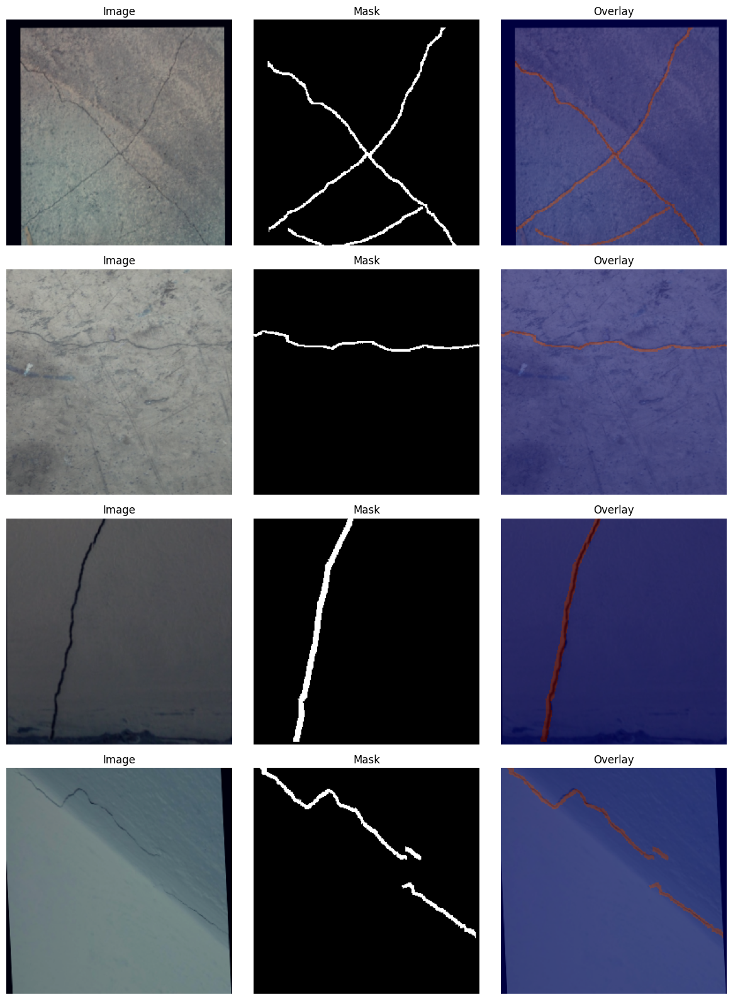

In [ ]:
batch = next(iter(train_loader))

show_segmentation_batch(
    batch
)

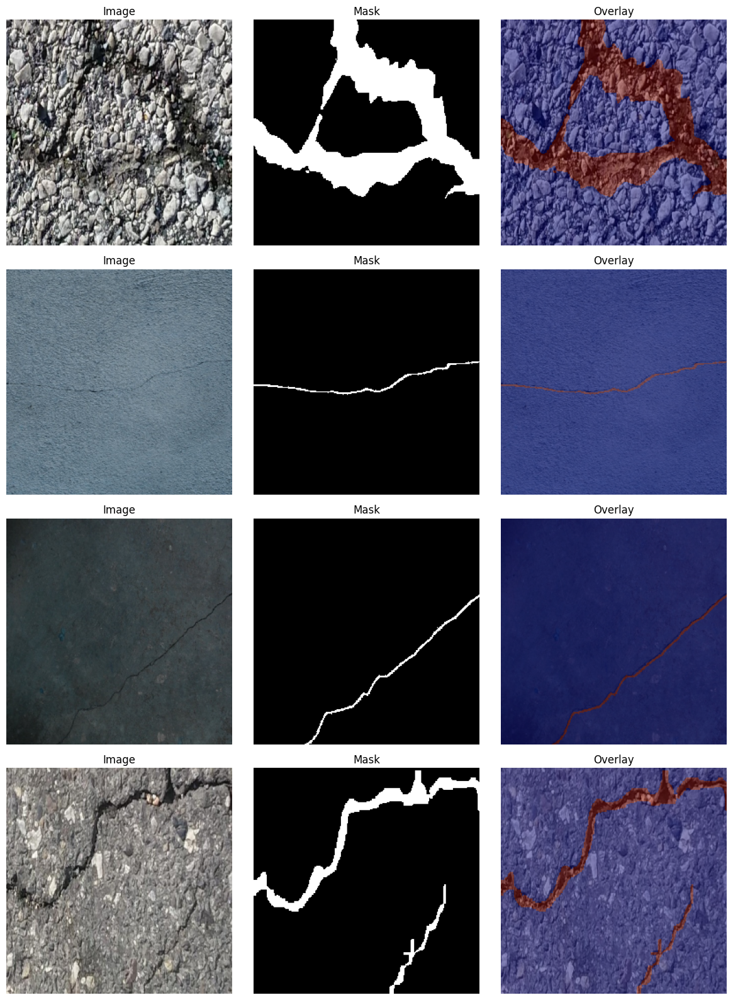

In [ ]:
val_batch = next(iter(val_loader))

show_segmentation_batch(
    val_batch
)

In [ ]:
mlflow.set_experiment('crack_segmentation')

with mlflow.start_run(run_name='data_split_and_dataloaders'):
    mlflow.log_params({
        'image_size': IMAGE_SIZE,
        'batch_size': BATCH_SIZE,
        'num_workers': NUM_WORKERS,
        'mask_threshold': MASK_THRESHOLD,
        'mask_invert': MASK_INVERT,
        'train_size': len(train_dataset),
        'val_size': len(val_dataset),
        'test_size': len(test_dataset),
        'seed': SEED
    })

    mlflow.log_artifact(str(ARTIFACT_DIR / 'splits.json'))
    mlflow.log_artifact(str(ARTIFACT_DIR / 'train_pairs.csv'))
    mlflow.log_artifact(str(ARTIFACT_DIR / 'val_pairs.csv'))
    mlflow.log_artifact(str(ARTIFACT_DIR / 'test_pairs.csv'))

print('Logged split and dataloader metadata to MLflow')

Logged split and dataloader metadata to MLflow


In [ ]:
from dataclasses import dataclass

import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class DoubleConv(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int = 8,
        num_groups: int = 8):

        super().__init__()

        if out_channels % num_groups != 0:
            raise ValueError(
                f'out_channels={out_channels} must be divisible'
                f'by num_groups={num_groups}'
            )

        self.block = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.GroupNorm(
                num_groups=num_groups,
                num_channels=out_channels
            ),

            nn.ReLU(inplace=True),

            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=3,
                padding=1,
                bias=False
            ),

            nn.GroupNorm(
                num_groups=num_groups,
                num_channels=out_channels
            ),

             nn.ReLU(inplace=True)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.block(x)

In [ ]:
class EncoderBlock(nn.Module):
    def __init__(self,
                 in_channels: int,
                 out_channels: int):
        super().__init__()

        self.conv = DoubleConv(
            in_channels=in_channels,
            out_channels=out_channels,
        )

        self.pool = nn.MaxPool2d(
            kernel_size=2,
            stride=2
        )

    def forward(
            self,
            x: torch.Tensor,
    ) -> tuple[torch.Tensor, torch.Tensor]:
        skip = self.conv(x)
        downsampled = self.pool(skip)

        return skip, downsampled

In [ ]:
class DecoderBlock(nn.Module):
    def __init__(
            self, in_channels: int, skip_channels: int, out_channels: int
    ):
        super().__init__()

        self.up = nn.ConvTranspose2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=2,
            stride=2
        )


        self.conv = DoubleConv(
            in_channels= out_channels + skip_channels,
            out_channels=out_channels
        )


    def forward(
            self,
            x: torch.Tensor,
            skip:torch.Tensor
    ) -> torch.Tensor:

        x = self.up(x)

        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(
                x,
                skip=skip.shape[-2:],
                mode='bilinear',
                align_corners=False
            )

        x = torch.cat([skip, x], dim=1)
        x = self.conv(x)

        return x


In [ ]:
class UNet(nn.Module):
    def __init__(
            self,
            in_channels: int = 3,
            out_channels: int = 1,
            base_channels: int = 32
    ):
        super().__init__()

        c1 = base_channels
        c2 = base_channels * 2
        c3 = base_channels * 4
        c4 = base_channels * 8
        c5 = base_channels * 16

        self.encoder1 = EncoderBlock(in_channels, c1)
        self.encoder2 = EncoderBlock(c1, c2)
        self.encoder3 = EncoderBlock(c2, c3)
        self.encoder4 = EncoderBlock(c3, c4)


        self.bottleneck = DoubleConv(c4, c5)


        self.decoder4 = DecoderBlock(
            in_channels=c5,
            skip_channels=c4,
            out_channels=c4
        )

        self.decoder3 = DecoderBlock(
            in_channels=c4,
            skip_channels=c3,
            out_channels=c3
        )

        self.decoder2 = DecoderBlock(
            in_channels=c3,
            skip_channels=c2,
            out_channels=c2
        )

        self.decoder1 = DecoderBlock(
            in_channels=c2,
            skip_channels=c1,
            out_channels=c1
        )

        self.output_conv = nn.Conv2d(
            in_channels=c1,
            out_channels=out_channels,
            kernel_size=1
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        skip1, x = self.encoder1(x)
        skip2, x = self.encoder2(x)
        skip3, x = self.encoder3(x)
        skip4, x = self.encoder4(x)

        x = self.bottleneck(x)

        x = self.decoder4(x, skip4)
        x = self.decoder3(x, skip3)
        x = self.decoder2(x, skip2)
        x = self.decoder1(x, skip1)

        logits = self.output_conv(x)

        return logits


In [ ]:
model = UNet(
    in_channels=3,
    out_channels=1,
    base_channels=32
).to(device)

model

UNet(
  (encoder1): EncoderBlock(
    (conv): DoubleConv(
      (block): Sequential(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): GroupNorm(8, 32, eps=1e-05, affine=True)
        (5): ReLU(inplace=True)
      )
    )
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (encoder2): EncoderBlock(
    (conv): DoubleConv(
      (block): Sequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): GroupNorm(8, 64, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): GroupNorm(8, 64, eps=1e-05, affine=True)
        (5): ReLU(inplace=True)
      )
    )
    (pool)

#Model Sanity check

#Parameter count

In [ ]:
def count_parameters(model: nn.Module) -> dict[str, int]:
    total = sum(
        parameter.numel()
        for parameter in model.parameters()
    )

    trainable = sum(
        parameter.numel()
        for parameter in model.parameters()
        if parameter.requires_grad
    )

    return {
        'total_parameters': total,
        'trainable_parameters': trainable
    }


count_parameters(model)

{'total_parameters': 7763041, 'trainable_parameters': 7763041}

#Forward pass check

In [ ]:
batch = next(iter(train_loader))

images = batch['image'].to(device)
masks = batch['mask'].to(device)

with torch.no_grad():
    logits = model(images)

print('Images:', images.shape)
print('Masks:', masks.shape)
print('Logits:', logits.shape)

print("Image dtype:", images.dtype)
print('Mask dtype:', masks.dtype)
print('Logit dtype:', logits.dtype)

Images: torch.Size([8, 3, 256, 256])
Masks: torch.Size([8, 1, 256, 256])
Logits: torch.Size([8, 1, 256, 256])
Image dtype: torch.float32
Mask dtype: torch.float32
Logit dtype: torch.float32


#strict checks

In [ ]:
assert logits.shape == masks.shape, (
    f'Output-target mismatch: '
    f'logits={logits.shape}, masks={masks.shape}'
)

assert masks.dtype == torch.float32

assert set(torch.unique(masks).tolist()).issubset({0.0, 1.0})

#Dice loss

In [ ]:
class BinaryDiceLoss(nn.Module):
    def __init__(self,
                 smooth: float = 1.0,
                 eps: float = 1e-7):

        super().__init__()

        self.smooth = smooth
        self.eps=eps

    def forward(
        self,
        logits: torch.Tensor,
        targets: torch.Tensor
    ) -> torch.Tensor:

        if logits.shape != targets.shape:
            raise ValueError(
                f'Shape mismatch: logits={logits.shape}, '
                f'targets={targets.shape}'
            )

        probabilities = torch.sigmoid(logits)

        probabilities = probabilities.flatten(start_dim=1)
        targets = targets.flatten(start_dim=1)

        intersection = (
            probabilities * targets
        ).sum(dim=1)

        denominator = (
            probabilities.sum(dim=1) + targets.sum(dim=1)
        )

        dice = (
            2.0 * intersection + self.smooth
        ) / (denominator + self.smooth + self.eps)

        return 1.0 - dice.mean()






#Combined BCE + Dice Loss

In [ ]:
class BCEDiceLoss(nn.Module):
    def __init__(
        self,
        bce_weight: float = 0.5,
        dice_weight: float = 0.5,
        pos_weight: torch.Tensor | None = None,
    ):
        super().__init__()

        if bce_weight < 0 or dice_weight < 0:
            raise ValueError('Loss weights must be non-negative')

        if bce_weight + dice_weight == 0:
            raise ValueError('At least one loss weight must be positive')

        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

        self.bce = nn.BCEWithLogitsLoss(
            pos_weight = pos_weight
        )
        self.dice = BinaryDiceLoss()

    def forward(
        self,
        logits: torch.Tensor,
        targets: torch.Tensor
    ) -> torch.Tensor:
        bce_loss = self.bce(logits, targets)
        dice_loss = self.dice(logits, targets)

        return self.bce_weight * bce_loss + self.dice_weight * dice_loss


In [ ]:
criterion = BCEDiceLoss(
    bce_weight=0.5,
    dice_weight=0.5
).to(device)

#Test loss and backwarad pass

In [ ]:
model.train()

batch = next(iter(train_loader))

images = batch['image'].to(device, non_blocking=True)

masks = batch['mask'].to(device, non_blocking=True)

model.zero_grad(set_to_none=True)

logits = model(images)
loss = criterion(logits, masks)

print('Initial loss:', loss.item())
loss.backward()

Initial loss: 0.8443357348442078


In [ ]:
parameters_with_grad = 0
parameters_without_grad = 0

for name, parameter in model.named_parameters():
    if parameter.requires_grad:
        if parameter.grad is None:
            parameters_without_grad += 1
        else:
            parameters_with_grad += 1


print('parameters with gradients: ', parameters_with_grad)
print('parameters without gradients: ', parameters_without_grad)

parameters with gradients:  64
parameters without gradients:  0


In [ ]:
sum([param.numel() for param in model.parameters()])

7763041

In [ ]:
def compute_gradient_norm(model: nn.Module) -> float:
    squared_norm_sum = 0.0

    for parameter in model.parameters():
        if parameter.grad is not None:
            parameter_norm = parameter.grad.detach().norm(2)
            squared_norm_sum += parameter_norm.item() ** 2

    return squared_norm_sum ** 0.5

print('Gradient norm:', compute_gradient_norm(model))

Gradient norm: 1.8289614991972465


In [ ]:
@dataclass
class BinarySegmentationStats:
    true_positive: float = 0.0
    false_positive: float = 0.0
    false_negative: float = 0.0
    true_negative: float = 0.0

    def update(
        self,
        logits: torch.Tensor,
        targets: torch.Tensor,
        threshold: float = 0.5
    ) -> None:

        probabilities = torch.sigmoid(logits)
        predictions = probabilities >= threshold
        targets_bool = targets >= 0.5

        self.true_positive += (
            predictions & targets_bool
        ).sum().item()

        self.false_positive += (
            predictions & ~targets_bool
        ).sum().item()

        self.false_negative += (
            ~predictions & targets_bool
        ).sum().item()

        self.true_negative += (
            ~predictions & ~targets_bool
        ).sum().item()

    def compute(self, eps: float = 1e-7) -> dict[str, float]:
        tp = self.true_positive
        fp = self.false_positive
        fn = self.false_negative
        tn = self.true_negative

        dice = (2.0 * tp) / (2 * tp + fn + fp + eps)

        iou = tp / (tp + fn + fp + eps)

        precision = tp / (tp + fp + eps)
        recall = tp / (tp + fn + eps)

        pixel_accuracy = (tp + tn) / (tp + fp + fn + tn + eps)

        specificity = tn / (tn + fp + eps)

        return {
            'dice': float(dice),
            'iou': float(iou),
            'precision': float(precision),
            'recall': float(recall),
            'specificity': float(specificity),
            'pixel_accuracy': float(pixel_accuracy),
}


In [ ]:
model.eval()

stats = BinarySegmentationStats()

with torch.no_grad():
    batch = next(iter(val_loader))

    images = batch['image'].to(device)
    masks = batch['mask'].to(device)

    logits = model(images)

    stats.update(logits, masks)


initial_metrics = stats.compute()
initial_metrics

{'dice': 0.11791884453330945,
 'iou': 0.06265343244673724,
 'precision': 0.06377308537870699,
 'recall': 0.7811149601772039,
 'specificity': 0.3530074331988642,
 'pixel_accuracy': 0.37587165832512365}

In [ ]:
@torch.no_grad()
def compute_batch_metrics(
    logits: torch.Tensor,
    targets: torch.Tensor,
    threshold: float = 0.5
) -> dict[str, float]:
    stats = BinarySegmentationStats()

    stats.update(
        logits,
        targets,
        threshold
    )

    return stats.compute()

In [ ]:
MODEL_CONFIG = {
    'model_name': "unet_from_scratch",
    'in_channels': 3,
    'out_channels': 1,
    'base_channels': 32,
    'normalization': 'group_norm',
    'loss_name': 'bce_dice',
    'bce_weight': 0.5,
    'dice_weight': 0.5,
    'prediction_threshold': 0.5,
    'image_size': IMAGE_SIZE
}

In [ ]:
with mlflow.start_run(run_name='unet_architecture_sanity_check'):
    mlflow.log_params(MODEL_CONFIG)

    parameters_counts = count_parameters(model)

    mlflow.log_metrics({
        'total_parameters': float(
            parameters_counts['total_parameters']
        ),
        'trainable_parameters': float(
            parameters_counts['trainable_parameters']
        ),
        'initial_batch_loss': float(loss.item()),
        'initial_gradient_norm': float(
            compute_gradient_norm(model)
        )
    })

print('Logged U-Net architecture sanity check')

Logged U-Net architecture sanity check


In [ ]:
NUM_EPOCHS = 10

LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4

MAX_GRAD_NORM = 5.0

PREDICTION_THRESHOLD = 0.5

EARLY_STOPPING_PATIENCE = 4

CHECKPOINT_PATH = (
    Path('/content/mlruns') / 'best_unet_baseline.pt')

In [ ]:
model = UNet(
    in_channels=3,
    out_channels=1,
    base_channels=32
).to(device)

criterion = BCEDiceLoss().to(device)

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='max',
    factor=0.5,
    patience=2,
    min_lr=1e-6
)

In [ ]:
AMP_ENABLED = device == 'cuda'

scaler = torch.amp.GradScaler(
    'cuda',
    enabled=AMP_ENABLED
)

In [ ]:
def train_one_epoch(
        model: nn.Module,
        loader: DataLoader,
        criterion: nn.Module,
        optimizer: torch.optim.Optimizer,
        scaler: torch.amp.GradScaler,
        device: str,
        threshold: float = 0.5,
        max_grad_norm: float | None = None
) -> dict:
    model.train()

    running_loss = 0.0
    total_samples = 0

    segmentation_stats = BinarySegmentationStats()

    gradient_norms = []


    for batch in loader:
        images = batch['image'].to(device, non_blocking=True)
        masks = batch['mask'].to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.autocast(
            device_type='cuda',
            dtype=torch.float16,
            enabled=(device=='cuda')
        ):
            logits = model(images)
            loss = criterion(logits, masks)

        scaler.scale(loss).backward()

        scaler.unscale_(optimizer)

        grad_norm = compute_gradient_norm(model)
        gradient_norms.append(grad_norm)

        if max_grad_norm is not None:
            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                max_norm=max_grad_norm
            )

        scaler.step(optimizer)
        scaler.update()


        batch_size = images.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        total_samples += batch_size

        segmentation_stats.update(
            logits=logits.detach(),
            targets=masks,
            threshold=threshold
        )

    metrics = segmentation_stats.compute()

    return {
        'loss': running_loss / total_samples,
        'dice': metrics['dice'],
        'iou': metrics['iou'],
        'precision': metrics['precision'],
        'recall': metrics['recall'],
        'specificity': metrics['specificity'],
        'pixel_accuracy': metrics['pixel_accuracy'],
        'grad_norm': float(np.mean(gradient_norms)),
        'max_observed_grad_norm': float(np.max(gradient_norms))
    }

In [ ]:
@torch.no_grad()
def validate_one_epoch(
        model: nn.Module,
        loader: DataLoader,
        criterion: nn.Module,
        device: str,
        threshold: float = 0.5
) -> dict:
    model.eval()

    running_loss = 0.0
    total_samples = 0

    segmentation_stats = BinarySegmentationStats()

    for batch in loader:
        images = batch['image'].to(device, non_blocking=True)

        masks = batch['mask'].to(device, non_blocking=True)

        with torch.autocast(
            device_type='cuda',
            dtype=torch.float16,
            enabled=(device=='cuda')
        ):
            logits = model(images)
            loss = criterion(logits, masks)

        batch_size = images.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        total_samples += batch_size

        segmentation_stats.update(
            logits=logits,
            targets=masks,
            threshold=threshold
        )
    metrics = segmentation_stats.compute()

    return {
        'loss': running_loss / total_samples,
        'dice': metrics['dice'],
        'iou': metrics['iou'],
        'precision': metrics['precision'],
        'recall': metrics['recall'],
        'specificity': metrics['specificity'],
        'pixel_accuracy': metrics['pixel_accuracy'],
    }

In [ ]:
class EarlyStopping:
    def __init__(
            self,
            patience: int = 6,
            min_delta: float = 1e-4
    ):
        self.patience = patience
        self.min_delta = min_delta

        self.best_score = -float('inf')
        self.counter = 0


    def step(self, score: float) -> bool:
        improved = (
            score > self.best_score + self.min_delta
        )

        if improved:
            self.best_score = score
            self.counter = 0
            return False

        self.counter += 1

        return self.counter >= self.patience

In [ ]:
early_stopping = EarlyStopping(
    patience=EARLY_STOPPING_PATIENCE,
    min_delta=1e-4
)

In [ ]:
def save_checkpoint(
        path,
        model,
        optimizer,
        scheduler,
        scaler,
        epoch,
        val_metrics,
        model_config
):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'val_metrics': val_metrics,
        'model_config': model_config,
        'image_size': IMAGE_SIZE,
        'mask_threshold': MASK_THRESHOLD,
        'prediction_threshold': PREDICTION_THRESHOLD,
        'seed': SEED
    }

    torch.save(
        checkpoint,
        path
    )

In [ ]:
def fit_segmentation(
        model: nn.Module,
        train_loader: DataLoader,
        valid_loader: DataLoader,
        criterion: nn.Module,
        optimizer: torch.optim.Optimizer,
        scheduler,
        scaler: torch.amp.GradScaler,
        device: str,
        num_epochs: int,
        checkpoint_path,
        model_config: dict,
        threshold: float = 0.5,
        max_grad_norm: float | None = None,
        early_stopping_patience: int = 4
) -> pd.DataFrame:
    history = []

    best_val_dice = -float('inf')
    best_epoch = 0

    early_stopping = EarlyStopping(
        patience=early_stopping_patience
    )

    for epoch in range(1, num_epochs + 1):
        epoch_start = time.perf_counter()

        train_metrics = train_one_epoch(
            model=model,
            loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            scaler=scaler,
            device=device,
            threshold=threshold,
            max_grad_norm=max_grad_norm
        )

        val_metrics = validate_one_epoch(
            model=model,
            loader=valid_loader,
            criterion=criterion,
            device=device,
            threshold=threshold
        )

        scheduler.step(
            val_metrics['dice']
        )

        epoch_time = time.perf_counter() - epoch_start

        current_lr = (
            optimizer.param_groups[0]['lr']
        )

        row = {
            'epoch': epoch,
            'train_loss': train_metrics['loss'],
            'train_dice': train_metrics['dice'],
            'train_iou': train_metrics['iou'],
            'train_precision': train_metrics['precision'],
            'train_recall': train_metrics['recall'],
            'train_pixel_accuracy': train_metrics['pixel_accuracy'],
            'val_loss': val_metrics['loss'],
            'val_dice': val_metrics['dice'],
            'val_iou': val_metrics['iou'],
            'val_precision': val_metrics['precision'],
            'val_recall': val_metrics['recall'],
            'val_specificity': val_metrics['specificity'],
            'val_pixel_accuracy': val_metrics['pixel_accuracy'],
            'grad_norm': train_metrics['grad_norm'],
            'max_grad_norm': train_metrics['max_observed_grad_norm'],

            'learning_rate': current_lr,
            'epoch_time_sec': epoch_time

        }

        history.append(row)

        mlflow.log_metrics(
            {
            key: float(value)
            for key, value in row.items()
            if key != 'epoch'
            },
            step=epoch
        )

        print(
            f'Epoch {epoch}/{num_epochs} | '
            f'train_loss={row['train_loss']:.4f} | '
            f'train_dice={row['train_dice']:.4f} | '
            f'val_loss={row['val_loss']:.4f} | '
            f'val_dice={row['val_dice']:.4f | }'
            f'val_iou={row['val_iou']:.4f} | '
            f'Val_Precision={row['val_precision']:.4f} | '
            f'Val_Recall={row['val_recall']:.4f} | '
            f'lr={row['learning_rate']} | '
            f'time={row['epoch_time_sec']}s'
        )

        if val_metrics['dice'] > best_val_dice:
            best_val_dice = val_metrics['dice']
            best_epoch = epoch

            save_checkpoint(
                path=checkpoint_path,
                model=model,
                optimizer=optimizer,
                scheduler=scheduler,
                scaler=scaler,
                epoch=epoch,
                val_metrics=val_metrics,
                model_config=model_config
            )

            print(
                f'Saved best checkpoint '
                f'Dice={best_val_dice}'
            )

        should_stop = early_stopping.step(
            val_metrics['dice']
        )


    print(f'Best epoch: {best_epoch}'
          f'Best validation Dice: '
          f'{best_val_dice}')

    return history

In [ ]:
def fit_segmentation(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    criterion: nn.Module,
    optimizer: torch.optim.Optimizer,
    scheduler,
    scaler: torch.amp.GradScaler,
    device: str,
    num_epochs: int,
    checkpoint_path,
    model_config: dict,
    threshold: float = 0.5,
    max_grad_norm: float | None = None,
    early_stopping_patience: int = 6,
) -> pd.DataFrame:

    history = []

    best_val_dice = -float("inf")
    best_epoch = 0

    early_stopping = EarlyStopping(
        patience=early_stopping_patience,
    )

    for epoch in range(1, num_epochs + 1):
        epoch_start = time.perf_counter()

        train_metrics = train_one_epoch(
            model=model,
            loader=train_loader,
            criterion=criterion,
            optimizer=optimizer,
            scaler=scaler,
            device=device,
            threshold=threshold,
            max_grad_norm=max_grad_norm,
        )

        val_metrics = validate_one_epoch(
            model=model,
            loader=val_loader,
            criterion=criterion,
            device=device,
            threshold=threshold,
        )

        scheduler.step(
            val_metrics["dice"]
        )

        epoch_time = (
            time.perf_counter()
            - epoch_start
        )

        current_lr = (
            optimizer.param_groups[0]["lr"]
        )

        row = {
            "epoch": epoch,

            "train_loss":
                train_metrics["loss"],

            "train_dice":
                train_metrics["dice"],

            "train_iou":
                train_metrics["iou"],

            "train_precision":
                train_metrics["precision"],

            "train_recall":
                train_metrics["recall"],

            "val_loss":
                val_metrics["loss"],

            "val_dice":
                val_metrics["dice"],

            "val_iou":
                val_metrics["iou"],

            "val_precision":
                val_metrics["precision"],

            "val_recall":
                val_metrics["recall"],

            "val_specificity":
                val_metrics["specificity"],

            "val_pixel_accuracy":
                val_metrics["pixel_accuracy"],

            "grad_norm":
                train_metrics["grad_norm"],

            "max_grad_norm":
                train_metrics[
                    "max_observed_grad_norm"
                ],

            "learning_rate":
                current_lr,

            "epoch_time_sec":
                epoch_time,
        }

        history.append(row)

        # MLflow supports metric logging with a
        # step, which maps naturally to epochs.
        mlflow.log_metrics(
            {
                key: float(value)
                for key, value in row.items()
                if key != "epoch"
            },
            step=epoch,
        )

        print(
            f"Epoch [{epoch}/{num_epochs}] | "
            f"train_loss={row['train_loss']:.4f} | "
            f"train_dice={row['train_dice']:.4f} | "
            f"val_loss={row['val_loss']:.4f} | "
            f"val_dice={row['val_dice']:.4f} | "
            f"val_iou={row['val_iou']:.4f} | "
            f"P={row['val_precision']:.4f} | "
            f"R={row['val_recall']:.4f} | "
            f"lr={row['learning_rate']:.2e} | "
            f"time={row['epoch_time_sec']:.1f}s"
        )

        if val_metrics["dice"] > best_val_dice:
            best_val_dice = val_metrics["dice"]
            best_epoch = epoch

            save_checkpoint(
                path=checkpoint_path,
                model=model,
                optimizer=optimizer,
                scheduler=scheduler,
                scaler=scaler,
                epoch=epoch,
                val_metrics=val_metrics,
                model_config=model_config,
            )

            print(
                f"  Saved best checkpoint "
                f"(Dice={best_val_dice:.4f})"
            )

        should_stop = early_stopping.step(
            val_metrics["dice"]
        )

        if should_stop:
            print(
                f"\nEarly stopping at epoch {epoch}."
            )
            break

    print(
        f"\nBest epoch: {best_epoch}"
        f"\nBest validation Dice: "
        f"{best_val_dice:.4f}"
    )

    return pd.DataFrame(history)

In [ ]:
MODEL_CONFIG = {
    "model_name":
        "unet_from_scratch",

    "base_channels":
        32,

    "normalization":
        "group_norm",

    "input_channels":
        3,

    "output_channels":
        1,

    "loss":
        "bce_plus_dice",

    "bce_weight":
        0.5,

    "dice_weight":
        0.5,

    "optimizer":
        "adamw",

    "learning_rate":
        LEARNING_RATE,

    "weight_decay":
        WEIGHT_DECAY,

    "scheduler":
        "reduce_lr_on_plateau",

    "scheduler_monitor":
        "val_dice",

    "prediction_threshold":
        PREDICTION_THRESHOLD,

    "batch_size":
        BATCH_SIZE,

    "image_size":
        IMAGE_SIZE,

    "amp":
        AMP_ENABLED,

    "max_grad_norm":
        MAX_GRAD_NORM,

    "seed":
        SEED,
}

In [ ]:
def audit_pair_shapes(pairs_df):
    rows = []

    for _, row in pairs_df.iterrows():
        image = read_image_rgb(row["image_path"])
        mask = read_mask_grayscale(row["mask_path"])

        image_h, image_w = image.shape[:2]
        mask_h, mask_w = mask.shape[:2]

        rows.append({
            "stem": row["stem"],
            "image_path": row["image_path"],
            "mask_path": row["mask_path"],

            "image_h": image_h,
            "image_w": image_w,

            "mask_h": mask_h,
            "mask_w": mask_w,

            "same_shape": (
                image_h == mask_h
                and image_w == mask_w
            ),

            "image_aspect_ratio": image_w / image_h,
            "mask_aspect_ratio": mask_w / mask_h,
        })

    return pd.DataFrame(rows)

In [ ]:
shape_audit_df = audit_pair_shapes(pairs_df)

mismatches_df = shape_audit_df[
    ~shape_audit_df["same_shape"]
].copy()

print("Total pairs:", len(shape_audit_df))
print("Mismatched pairs:", len(mismatches_df))

mismatches_df.head(20)

Total pairs: 8818
Mismatched pairs: 21


,stem,image_path,mask_path,image_h,image_w,mask_h,mask_w,same_shape,image_aspect_ratio,mask_aspect_ratio
8590,_002,/content/Concrete/Concrete/Positive/Images/_00...,/content/Concrete/Concrete/Positive/Masks/_002...,768,768,256,256,False,1.0,1.0
8591,_003,/content/Concrete/Concrete/Positive/Images/_00...,/content/Concrete/Concrete/Positive/Masks/_003...,768,768,256,256,False,1.0,1.0
8592,_004,/content/Concrete/Concrete/Positive/Images/_00...,/content/Concrete/Concrete/Positive/Masks/_004...,768,768,256,256,False,1.0,1.0
8593,_005,/content/Concrete/Concrete/Positive/Images/_00...,/content/Concrete/Concrete/Positive/Masks/_005...,768,768,256,256,False,1.0,1.0
8594,_006,/content/Concrete/Concrete/Positive/Images/_00...,/content/Concrete/Concrete/Positive/Masks/_006...,768,768,256,256,False,1.0,1.0
8595,_007,/content/Concrete/Concrete/Positive/Images/_00...,/content/Concrete/Concrete/Positive/Masks/_007...,768,768,256,256,False,1.0,1.0
8596,_008,/content/Concrete/Concrete/Positive/Images/_00...,/content/Concrete/Concrete/Positive/Masks/_008...,768,768,256,256,False,1.0,1.0
8597,_010,/content/Concrete/Concrete/Positive/Images/_01...,/content/Concrete/Concrete/Positive/Masks/_010...,768,768,256,256,False,1.0,1.0
8598,_011,/content/Concrete/Concrete/Positive/Images/_01...,/content/Concrete/Concrete/Positive/Masks/_011...,768,768,256,256,False,1.0,1.0
8600,_013,/content/Concrete/Concrete/Positive/Images/_01...,/content/Concrete/Concrete/Positive/Masks/_013...,768,768,256,256,False,1.0,1.0


In [ ]:
mlflow.set_experiment(
    "crack_segmentation"
)

with mlflow.start_run(
    run_name="unet_baseline_bce_dice"
):

    mlflow.log_params(
        MODEL_CONFIG
    )

    history_df = fit_segmentation(
        model=model,

        train_loader=train_loader,
        val_loader=val_loader,

        criterion=criterion,

        optimizer=optimizer,
        scheduler=scheduler,
        scaler=scaler,

        device=device,

        num_epochs=NUM_EPOCHS,

        checkpoint_path=
            CHECKPOINT_PATH,

        model_config=
            MODEL_CONFIG,

        threshold=
            PREDICTION_THRESHOLD,

        max_grad_norm=
            MAX_GRAD_NORM,

        early_stopping_patience=
            EARLY_STOPPING_PATIENCE,
    )

    history_path = (
        ARTIFACT_DIR
        / "unet_baseline_history.csv"
    )

    history_df.to_csv(
        history_path,
        index=False,
    )

    mlflow.log_artifact(
        str(history_path),
        artifact_path="training",
    )

    mlflow.log_artifact(
        str(CHECKPOINT_PATH),
        artifact_path="checkpoints",
    )

Epoch [1/10] | train_loss=0.3665 | train_dice=0.4967 | val_loss=0.3013 | val_dice=0.5889 | val_iou=0.4173 | P=0.6507 | R=0.5378 | lr=1.00e-03 | time=95.6s
  Saved best checkpoint (Dice=0.5889)
Epoch [2/10] | train_loss=0.2876 | train_dice=0.6126 | val_loss=0.2711 | val_dice=0.6343 | val_iou=0.4644 | P=0.6136 | R=0.6564 | lr=1.00e-03 | time=100.3s
  Saved best checkpoint (Dice=0.6343)
Epoch [3/10] | train_loss=0.2664 | train_dice=0.6461 | val_loss=0.2480 | val_dice=0.6669 | val_iou=0.5003 | P=0.6866 | R=0.6483 | lr=1.00e-03 | time=99.3s
  Saved best checkpoint (Dice=0.6669)
Epoch [4/10] | train_loss=0.2541 | train_dice=0.6657 | val_loss=0.2620 | val_dice=0.6394 | val_iou=0.4700 | P=0.6856 | R=0.5991 | lr=1.00e-03 | time=110.3s
Epoch [5/10] | train_loss=0.2455 | train_dice=0.6781 | val_loss=0.2367 | val_dice=0.6938 | val_iou=0.5311 | P=0.6595 | R=0.7317 | lr=1.00e-03 | time=112.9s
  Saved best checkpoint (Dice=0.6938)
Epoch [6/10] | train_loss=0.2402 | train_dice=0.6871 | val_loss=0.2320

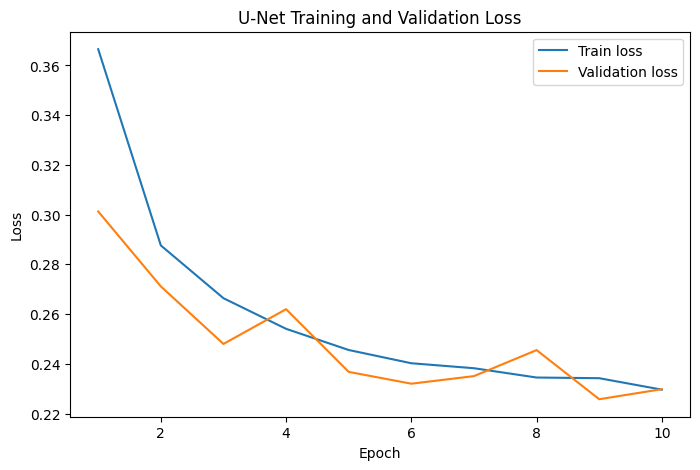

In [ ]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_df["epoch"],
    history_df["train_loss"],
    label="Train loss",
)

plt.plot(
    history_df["epoch"],
    history_df["val_loss"],
    label="Validation loss",
)

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.title(
    "U-Net Training and Validation Loss"
)

plt.legend()
plt.show()

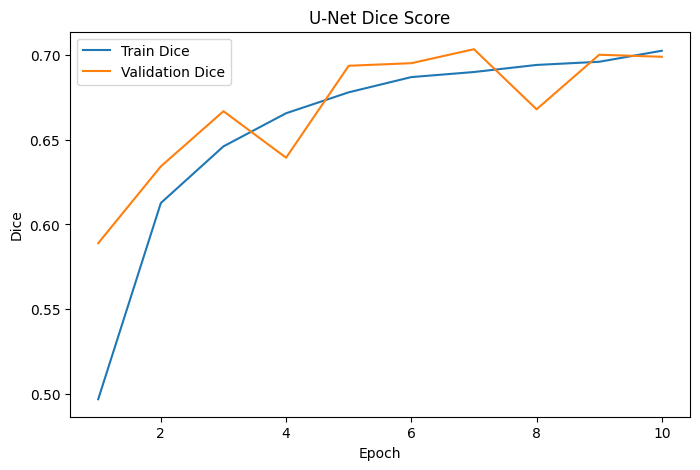

In [ ]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_df["epoch"],
    history_df["train_dice"],
    label="Train Dice",
)

plt.plot(
    history_df["epoch"],
    history_df["val_dice"],
    label="Validation Dice",
)

plt.xlabel("Epoch")
plt.ylabel("Dice")

plt.title(
    "U-Net Dice Score"
)

plt.legend()
plt.show()

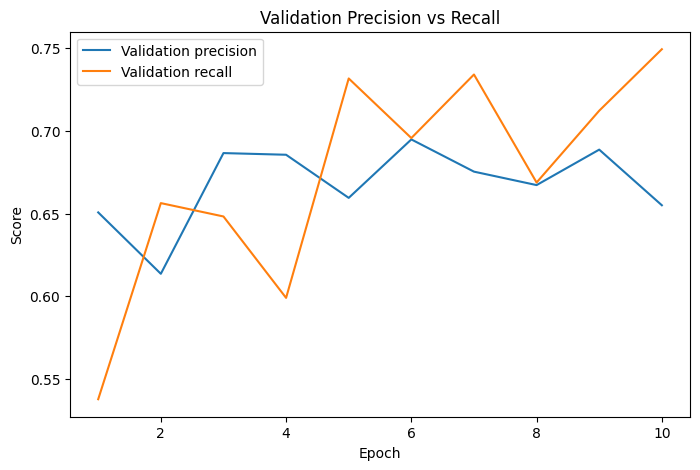

In [ ]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_df["epoch"],
    history_df["val_precision"],
    label="Validation precision",
)

plt.plot(
    history_df["epoch"],
    history_df["val_recall"],
    label="Validation recall",
)

plt.xlabel("Epoch")
plt.ylabel("Score")

plt.title(
    "Validation Precision vs Recall"
)

plt.legend()
plt.show()

In [ ]:
checkpoint = torch.load(
    CHECKPOINT_PATH,
    map_location=device,
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

print(
    "Best epoch:",
    checkpoint["epoch"]
)

print(
    "Validation metrics:",
    checkpoint["val_metrics"]
)

Best epoch: 7
Validation metrics: {'loss': 0.23503548101728286, 'dice': 0.703532730758505, 'iou': 0.5426536769957259, 'precision': 0.6753885406494889, 'recall': 0.7341245140716112, 'specificity': 0.9876999067715406, 'pixel_accuracy': 0.9791580165594872}


In [ ]:
import mlflow

print("MLflow version:", mlflow.__version__)
print("Tracking URI:", mlflow.get_tracking_uri())

MLflow version: 3.16.1
Tracking URI: sqlite:////content/mlflow.db


In [ ]:
experiments = mlflow.search_experiments()

for experiment in experiments:
    print(
        "ID:", experiment.experiment_id,
        "| Name:", experiment.name,
        "| Artifact location:", experiment.artifact_location,
    )

ID: 1 | Name: crack_segmentation | Artifact location: /content/mlruns/1
ID: 0 | Name: Default | Artifact location: /content/mlruns/0


In [ ]:
runs = mlflow.search_runs(
    experiment_names=["crack_segmentation"],
    order_by=["attributes.start_time DESC"],
)

print("Number of runs:", len(runs))

runs.head()

Number of runs: 4


,run_id,experiment_id,status,artifact_uri,start_time,end_time,metrics.val_iou,metrics.grad_norm,metrics.val_pixel_accuracy,metrics.val_specificity,...,params.mask_format,params.num_images,params.task_type,params.num_masks,params.num_missing_masks,params.num_matched_pairs,tags.mlflow.source.name,tags.mlflow.user,tags.mlflow.source.type,tags.mlflow.runName
0,a969b2fccfbd44fa940da818e63b9b09,1,FINISHED,/content/mlruns/1/a969b2fccfbd44fa940da818e63b...,2026-09-20 06:34:53.254000+00:00,2026-09-20 06:52:08.643000+00:00,0.537357,0.23854,0.978266,0.986243,...,None,None,None,None,None,None,fileId=1t4qs28F4XjTlXymC-f90fvg70xjl9IrD,root,NOTEBOOK,unet_baseline_bce_dice
1,022d99db3d174ca88fd659cc1edf72b4,1,FINISHED,/content/mlruns/1/022d99db3d174ca88fd659cc1edf...,2026-09-20 06:34:19.233000+00:00,2026-09-20 06:34:19.295000+00:00,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,fileId=1t4qs28F4XjTlXymC-f90fvg70xjl9IrD,root,NOTEBOOK,unet_architecture_sanity_check
2,ef82656b0bf3405cb87e3e76d775ecc3,1,FINISHED,/content/mlruns/1/ef82656b0bf3405cb87e3e76d775...,2026-09-20 06:34:16.989000+00:00,2026-09-20 06:34:17.043000+00:00,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,fileId=1t4qs28F4XjTlXymC-f90fvg70xjl9IrD,root,NOTEBOOK,data_split_and_dataloaders
3,c4bd601747264cf3b5f8f6af499399e7,1,FINISHED,/content/mlruns/1/c4bd601747264cf3b5f8f6af4993...,2026-09-20 06:34:09.383000+00:00,2026-09-20 06:34:09.444000+00:00,NaN,NaN,NaN,NaN,...,binary_jpg_grayscale_thresholded,8818,binary,8819,0,8818,fileId=1t4qs28F4XjTlXymC-f90fvg70xjl9IrD,root,NOTEBOOK,dataset_inspection


In [ ]:
columns = [
    "run_id",
    "tags.mlflow.runName",
    "status",

    "params.model_name",
    "params.image_size",
    "params.batch_size",
    "params.learning_rate",

    "metrics.train_loss",
    "metrics.val_loss",

    "metrics.train_dice",
    "metrics.val_dice",

    "metrics.val_iou",
    "metrics.val_precision",
    "metrics.val_recall",
]

existing_columns = [
    column
    for column in columns
    if column in runs.columns
]

runs[existing_columns]

,run_id,tags.mlflow.runName,status,params.model_name,params.image_size,params.batch_size,params.learning_rate,metrics.train_loss,metrics.val_loss,metrics.train_dice,metrics.val_dice,metrics.val_iou,metrics.val_precision,metrics.val_recall
0,a969b2fccfbd44fa940da818e63b9b09,unet_baseline_bce_dice,FINISHED,unet_from_scratch,256,8,0.001,0.229595,0.229782,0.702636,0.699066,0.537357,0.655061,0.74941
1,022d99db3d174ca88fd659cc1edf72b4,unet_architecture_sanity_check,FINISHED,unet_from_scratch,256,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ef82656b0bf3405cb87e3e76d775ecc3,data_split_and_dataloaders,FINISHED,None,256,8,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,c4bd601747264cf3b5f8f6af499399e7,dataset_inspection,FINISHED,None,256,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
from mlflow.tracking import MlflowClient

client = MlflowClient()

In [ ]:
def build_experiment_summary(
    experiment_name: str = "crack_segmentation",
):
    runs = mlflow.search_runs(
        experiment_names=[experiment_name],
    )

    client = MlflowClient()

    rows = []

    for _, run in runs.iterrows():

        run_id = run["run_id"]

        try:
            history = client.get_metric_history(
                run_id,
                "val_dice",
            )
        except Exception:
            history = []

        if len(history) == 0:
            continue

        best_metric = max(
            history,
            key=lambda x: x.value,
        )

        rows.append(
            {
                "run_id": run_id,

                "run_name":
                    run.get(
                        "tags.mlflow.runName",
                        None,
                    ),

                "model":
                    run.get(
                        "params.model_name",
                        None,
                    ),

                "image_size":
                    run.get(
                        "params.image_size",
                        None,
                    ),

                "learning_rate":
                    run.get(
                        "params.learning_rate",
                        None,
                    ),

                "best_val_dice":
                    best_metric.value,

                "best_epoch":
                    best_metric.step,

                "latest_val_iou":
                    run.get(
                        "metrics.val_iou",
                        np.nan,
                    ),

                "latest_val_precision":
                    run.get(
                        "metrics.val_precision",
                        np.nan,
                    ),

                "latest_val_recall":
                    run.get(
                        "metrics.val_recall",
                        np.nan,
                    ),
            }
        )

    result = pd.DataFrame(rows)

    if len(result) > 0:
        result = result.sort_values(
            "best_val_dice",
            ascending=False,
        )

    return result

In [ ]:
experiment_summary = build_experiment_summary()

experiment_summary

,run_id,run_name,model,image_size,learning_rate,best_val_dice,best_epoch,latest_val_iou,latest_val_precision,latest_val_recall
0,a969b2fccfbd44fa940da818e63b9b09,unet_baseline_bce_dice,unet_from_scratch,256,0.001,0.703533,7,0.537357,0.655061,0.74941


In [ ]:
from torchvision.models import (
    resnet34,
    ResNet34_Weights
)

In [ ]:
class ResNetDecoderBlock(nn.Module):
    def __init__(
            self,
            in_channels,
            skip_channels,
            out_channels
    ):
        super().__init__()

        self.up = nn.ConvTranspose2d(
            in_channels,
            out_channels,
            kernel_size=2,
            stride=2
        )

        self.conv = DoubleConv(
            in_channels=(
                out_channels + skip_channels
            ),
            out_channels=out_channels
        )


    def forward(
            self,
            x,
            skip
    ):
        x = self.up(x)

        if x.shape[-2:] != skip.shape[-2:]:
            x = F.interpolate(
                x,
                size=skip.shape[-2:],
                mode='bilinear'
            )

        x = torch.cat(
            [x, skip],
            dim=1
        )

        return self.conv(x)

In [ ]:
class ResNet34UNet(nn.Module):
    def __init__(
            self,
            pretrained=True,
            out_channels=1
    ):
        super().__init__()

        weights = (
            ResNet34_Weights.DEFAULT
            if pretrained
            else None
        )

        backbone = resnet34(
            weights=weights
        )


        #Encoder
        self.stem = nn.Sequential(
            backbone.conv1,
            backbone.bn1,
            backbone.relu
        )

        self.maxpool = backbone.maxpool

        self.layer1 = backbone.layer1

        self.layer2 = backbone.layer2

        self.layer3 = backbone.layer3

        self.layer4 = backbone.layer4

        #Decoder
        self.decoder4 = ResNetDecoderBlock(
            in_channels=512,
            skip_channels=256,
            out_channels=256
        )

        self.decoder3 = ResNetDecoderBlock(
            in_channels=256,
            skip_channels=128,
            out_channels=128
        )

        self.decoder2 = ResNetDecoderBlock(
            in_channels=128,
            skip_channels=64,
            out_channels=64
        )

        self.decoder1 = ResNetDecoderBlock(
            in_channels=64,
            skip_channels=64,
            out_channels=64
        )

        self.final_up = nn.ConvTranspose2d(
            64,
            32,
            kernel_size=2,
            stride=2
        )

        self.final_conv = DoubleConv(
            32,
            32
        )

        self.output_conv = nn.Conv2d(
            32,
            out_channels,
            kernel_size=1
        )

    def forward(self, X):
        skip0 = self.stem(X)

        x = self.maxpool(skip0)

        skip1 = self.layer1(x)
        skip2 = self.layer2(skip1)
        skip3 = self.layer3(skip2)
        x = self.layer4(skip3)


        x = self.decoder4(
            x,
            skip3
        )

        x = self.decoder3(
            x,
            skip2
        )

        x = self.decoder2(
            x,
            skip1
        )

        x = self.decoder1(
            x,
            skip0
        )

        x = self.final_up(x)
        x = self.final_conv(x)

        logits = self.output_conv(x)

        return logits

In [ ]:
pretrained_model = ResNet34UNet(
    pretrained=True,
    out_channels=1
).to(device)

In [ ]:
count_parameters(pretrained_model)

{'total_parameters': 24451585, 'trainable_parameters': 24451585}

In [ ]:
count_parameters(model)

{'total_parameters': 7763041, 'trainable_parameters': 7763041}

In [ ]:
batch = next(iter(train_loader))

images = batch['image'].to(device)
masks = batch['mask'].to(device)

pretrained_model.eval()

with torch.no_grad():
    logits = pretrained_model(images)


assert logits.shape == masks.shape

In [ ]:
def set_encoder_trainable(
        model,
        trainable: bool
):
    encoder_modules = [
        model.stem,
        model.layer1,
        model.layer2,
        model.layer3,
        model.layer4
    ]

    for module in encoder_modules:
        for parameter in module.parameters():
            parameter.requires_grad = trainable

In [ ]:
set_encoder_trainable(
    pretrained_model,
    False
)

In [ ]:
count_parameters(pretrained_model)

{'total_parameters': 24451585, 'trainable_parameters': 3166913}

In [ ]:
pretrained_criterion = BCEDiceLoss(
    bce_weight=0.5,
    dice_weight=0.5
).to(device)

In [ ]:
pretrained_optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        pretrained_model.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4
)

In [ ]:
pretrained_scheduler = (
    torch.optim.lr_scheduler.ReduceLROnPlateau(
    pretrained_optimizer,
    mode='max',
    factor=0.5,
    patience=2,
    min_lr=1e-6
    )
)

In [ ]:
pretrained_scaler = torch.amp.GradScaler(
    'cuda',
    enabled=(device=='cuda')
)

In [ ]:
PRETRAINED_CONFIG = {
    'model_name': 'unet_resnet34',
    'encoder': 'resnet34',
    'encoder_pretrained': True,
    'pretrained_dataset': 'imagenet1k',
    'encoder_frozen': True,
    'loss': 'bce_plus_dice',
    'bce_weight': 0.5,
    'dice_weight': 0.5,
    'optimizer': 'adamw',
    'learning_rate': 1e-3,
    'weight_decay': 1e-4,
    'batch_size': BATCH_SIZE,
    'image_size': IMAGE_SIZE,
    'pretrained_threshold': 0.5,
    'training_stage': 'feature_extraction',
    'seed': SEED
}

In [ ]:
CHECKPOINT_DIR = (
    ARTIFACT_DIR / 'checkpoints'
)

CHECKPOINT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

PRETRAINED_CHECKPOINT = (
    CHECKPOINT_DIR / 'best_resnet34_unet_frozen.pt'
)

In [ ]:
mlflow.set_experiment(
    'crack_segmentation'
)

with mlflow.start_run(
    run_name='unet_resnet34_frozen_encoder'
):
    mlflow.log_params(
        PRETRAINED_CONFIG
    )

    pretrained_history = fit_segmentation(
        model=pretrained_model,

        train_loader=train_loader,
        val_loader=val_loader,

        criterion=pretrained_criterion,

        optimizer=pretrained_optimizer,
        scheduler=pretrained_scheduler,
        scaler=pretrained_scaler,

        device=device,

        num_epochs=15,

        checkpoint_path=
            PRETRAINED_CHECKPOINT,

        model_config=
            PRETRAINED_CONFIG,

        threshold=
            PREDICTION_THRESHOLD,

        max_grad_norm=
            MAX_GRAD_NORM,

        early_stopping_patience=
            EARLY_STOPPING_PATIENCE,
    )

    history_path = (
        ARTIFACT_DIR
        / "resnet34_unet_frozen_history.csv"
    )

    history_df.to_csv(
        history_path,
        index=False,
    )

    mlflow.log_artifact(
        str(history_path),
        artifact_path="training",
    )

    mlflow.log_artifact(
        str(PRETRAINED_CHECKPOINT),
        artifact_path="checkpoints",
    )

Epoch [1/15] | train_loss=0.3390 | train_dice=0.5575 | val_loss=0.2550 | val_dice=0.6482 | val_iou=0.4795 | P=0.7222 | R=0.5879 | lr=1.00e-03 | time=63.6s
  Saved best checkpoint (Dice=0.6482)
Epoch [2/15] | train_loss=0.2656 | train_dice=0.6451 | val_loss=0.2593 | val_dice=0.6666 | val_iou=0.4999 | P=0.6206 | R=0.7199 | lr=1.00e-03 | time=62.9s
  Saved best checkpoint (Dice=0.6666)
Epoch [3/15] | train_loss=0.2547 | train_dice=0.6634 | val_loss=0.2423 | val_dice=0.6750 | val_iou=0.5094 | P=0.6898 | R=0.6608 | lr=1.00e-03 | time=63.2s
  Saved best checkpoint (Dice=0.6750)
Epoch [4/15] | train_loss=0.2501 | train_dice=0.6692 | val_loss=0.2393 | val_dice=0.6770 | val_iou=0.5118 | P=0.6830 | R=0.6712 | lr=1.00e-03 | time=61.8s
  Saved best checkpoint (Dice=0.6770)
Epoch [5/15] | train_loss=0.2466 | train_dice=0.6763 | val_loss=0.2341 | val_dice=0.6949 | val_iou=0.5325 | P=0.6571 | R=0.7374 | lr=1.00e-03 | time=62.2s
  Saved best checkpoint (Dice=0.6949)
Epoch [6/15] | train_loss=0.2426 | 

In [ ]:
experiment_summary = (
    build_experiment_summary()
)

experiment_summary

,run_id,run_name,model,image_size,learning_rate,best_val_dice,best_epoch,latest_val_iou,latest_val_precision,latest_val_recall
0,cd7ca15446d7494f8fff593e9608c554,unet_resnet34_frozen_encoder,unet_resnet34,256,0.001,0.721937,13,0.557699,0.672245,0.765974
1,a969b2fccfbd44fa940da818e63b9b09,unet_baseline_bce_dice,unet_from_scratch,256,0.001,0.703533,7,0.537357,0.655061,0.749410


#Stage 2 Fine-Tunning

In [ ]:
# 1) load best checkpoint
# 2) unfreeze layers 3 and 4(encoder) (use smaller lr)
# 3) Log the results into MLFlow

# Stage 3 Use segmentation Pretrained model